In [ ]:
import os
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
pd.set_option('display.max_rows', None)  # To display all rows
pd.set_option('display.max_columns', None)  # To display all columns

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("gunavenkatdoddi/preprocessed-eye-diseases-fundus-images")

print("Path to dataset files:", path)

100%|██████████| 472M/472M [00:25<00:00, 19.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/gunavenkatdoddi/preprocessed-eye-diseases-fundus-images/versions/1


In [ ]:
# ----- 1. Crear división automática de los datos -----
# Ruta original del dataset (debe tener las carpetas: cataract, diabetic_retinopathy, glaucoma, normal)
seg_dataset_path = '/root/.cache/kagglehub/datasets/gunavenkatdoddi/preprocessed-eye-diseases-fundus-images/versions/1/seg_dataset'  # Modifica esta ruta
# Carpeta donde se creará la división en train, val y test
split_dataset_dir = '/root/.cache/kagglehub/datasets/gunavenkatdoddi/preprocessed-eye-diseases-fundus-images/versions/1/seg_dataset'
if not os.path.exists(split_dataset_dir):
    os.makedirs(split_dataset_dir)

splits = ['train', 'val', 'test']
categories = ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

# Crear la estructura de carpetas para cada split y categoría
for split in splits:
    for cat in categories:
        os.makedirs(os.path.join(split_dataset_dir, split, cat), exist_ok=True)

# Parámetros de división (porcentaje de train, val y test)
train_pct = 0.7
val_pct = 0.15
test_pct = 0.15


In [ ]:
import random
import shutil
# Distribuir las imágenes de cada categoría
for cat in categories:
    cat_dir = os.path.join(seg_dataset_path, cat)
    images = [img for img in os.listdir(cat_dir) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
    random.shuffle(images)
    total = len(images)
    train_end = int(total * train_pct)
    val_end = train_end + int(total * val_pct)

    train_imgs = images[:train_end]
    val_imgs = images[train_end:val_end]
    test_imgs = images[val_end:]

    # Copiar las imágenes a las carpetas correspondientes
    for img in train_imgs:
        shutil.copy(os.path.join(cat_dir, img), os.path.join(split_dataset_dir, 'train', cat, img))
    for img in val_imgs:
        shutil.copy(os.path.join(cat_dir, img), os.path.join(split_dataset_dir, 'val', cat, img))
    for img in test_imgs:
        shutil.copy(os.path.join(cat_dir, img), os.path.join(split_dataset_dir, 'test', cat, img))

print("División de dataset completada.")

División de dataset completada.


In [ ]:
from tensorflow.keras.applications.efficientnet import preprocess_input
# ----- 2. Preparación de los datos con Data Augmentation -----
img_size = (224, 224)
batch_size = 32
num_classes = len(categories)

# Data augmentation para training y validación
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Directorios de los splits
train_dir = os.path.join(split_dataset_dir, 'train')
val_dir   = os.path.join(split_dataset_dir, 'val')
test_dir  = os.path.join(split_dataset_dir, 'test')


In [ ]:
# Generadores
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

validation_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 2949 images belonging to 4 classes.
Found 631 images belonging to 4 classes.
Found 637 images belonging to 4 classes.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.utils import class_weight
import plotly.express as px
import plotly.graph_objects as go

# ----- 3. Construcción del modelo con EfficientNetB0 -----
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(img_size[0], img_size[1], 3))
base_model.trainable = False  # Congelamos la base inicialmente

inputs = Input(shape=(img_size[0], img_size[1], 3))
x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(num_classes, activation='softmax')(x)
model = Model(inputs, outputs)

# Compilación inicial
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4)                   │           5,124 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,054,695 (15.47 MB)

 Trainable params: 5,124 (20.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
# ----- 4. Entrenamiento inicial (base congelada) -----
epochs_initial = 20
history_initial = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs_initial
)

# Evaluación en el conjunto de test (inicial)
test_generator.reset()
predictions = model.predict(test_generator)
y_pred = predictions.argmax(axis=1)
y_true = test_generator.classes


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 99s 807ms/step - accuracy: 0.4776 - auc: 0.7417 - loss: 1.1548 - val_accuracy: 0.6387 - val_auc: 0.8856 - val_loss: 0.8090
Epoch 2/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 48s 519ms/step - accuracy: 0.6858 - auc: 0.9046 - loss: 0.7496 - val_accuracy: 0.6941 - val_auc: 0.9109 - val_loss: 0.7193
Epoch 3/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 49s 526ms/step - accuracy: 0.7210 - auc: 0.9242 - loss: 0.6663 - val_accuracy: 0.7242 - val_auc: 0.9171 - val_loss: 0.6947
Epoch 4/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 83s 531ms/step - accuracy: 0.7447 - auc: 0.9334 - loss: 0.6238 - val_accuracy: 0.7242 - val_auc: 0.9164 - val_loss: 0.6921
Epoch 5/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 80s 520ms/step - accuracy: 0.7422 - auc: 0.9338 - loss: 0.6197 - val_accuracy: 0.7433 - val_auc: 0.9205 - val_loss: 0.6801
Epoch 6/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 48s 520ms/step - accuracy: 0.7607 - auc: 0.9395 - loss: 0.5927 - val_accuracy: 0.7702 - val_auc: 0.9307 - val_loss: 0.6418
Epoch 7/20
93/93 ━━━━━━━━━━━━━━━━━

In [ ]:
print("Accuracy inicial en test:", accuracy_score(y_true, y_pred))
print("Reporte de clasificación (inicial):")
print(classification_report(y_true, y_pred, target_names=list(train_generator.class_indices.keys())))

# Matriz de confusión inicial
cm = confusion_matrix(y_true, y_pred)
fig_cm = px.imshow(cm, text_auto=True,
                     title="Matriz de Confusión - Inicial",
                     labels=dict(x="Predicción", y="Real", color="Cantidad"),
                     x=list(train_generator.class_indices.keys()),
                     y=list(train_generator.class_indices.keys()))
fig_cm.show()

Accuracy inicial en test: 0.7613814756671899
Reporte de clasificación (inicial):
                      precision    recall  f1-score   support

            cataract       0.88      0.87      0.88       157
diabetic_retinopathy       0.92      0.76      0.83       166
            glaucoma       0.89      0.43      0.58       152
              normal       0.58      0.97      0.72       162

            accuracy                           0.76       637
           macro avg       0.82      0.76      0.75       637
        weighted avg       0.82      0.76      0.76       637



In [ ]:
# ----- 5. Fine-Tuning: Descongelar parte de EfficientNet -----
base_model.trainable = True
fine_tune_at = 100
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Calcular class weights para ajustar el desbalance
y_train = train_generator.classes
cw = class_weight.compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights = {i: cw[i] for i in range(len(cw))}
print("Class weights:", class_weights)

# Recompilar con learning rate reducido para fine-tuning
model.compile(optimizer=Adam(learning_rate=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

epochs_ft = 10
history_ft = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs_ft,
    class_weight=class_weights
)

# Evaluación final en test después de fine-tuning
test_generator.reset()
predictions_ft = model.predict(test_generator)
y_pred_ft = predictions_ft.argmax(axis=1)

print("Accuracy final en test:", accuracy_score(y_true, y_pred_ft))
print("Reporte final de clasificación:")
print(classification_report(y_true, y_pred_ft, target_names=list(train_generator.class_indices.keys())))

cm_ft = confusion_matrix(y_true, y_pred_ft)
fig_cm_ft = px.imshow(cm_ft, text_auto=True,
                     title="Matriz de Confusión - Fine-Tuning",
                     labels=dict(x="Predicción", y="Real", color="Cantidad"),
                     x=list(train_generator.class_indices.keys()),
                     y=list(train_generator.class_indices.keys()))
fig_cm_ft.show()

Class weights: {0: 1.015495867768595, 1: 0.9599609375, 2: 1.0472301136363635, 3: 0.9816910785619174}
Epoch 1/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 139s 910ms/step - accuracy: 0.5504 - auc: 0.7981 - loss: 1.1617 - val_accuracy: 0.7765 - val_auc: 0.9395 - val_loss: 0.5941
Epoch 2/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 83s 545ms/step - accuracy: 0.6541 - auc: 0.8720 - loss: 0.8762 - val_accuracy: 0.7544 - val_auc: 0.9293 - val_loss: 0.6424
Epoch 3/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 51s 549ms/step - accuracy: 0.6770 - auc: 0.8979 - loss: 0.7733 - val_accuracy: 0.7575 - val_auc: 0.9274 - val_loss: 0.6480
Epoch 4/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 83s 559ms/step - accuracy: 0.6999 - auc: 0.9090 - loss: 0.7339 - val_accuracy: 0.7591 - val_auc: 0.9309 - val_loss: 0.6314
Epoch 5/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 50s 543ms/step - accuracy: 0.7423 - auc: 0.9251 - loss: 0.6633 - val_accuracy: 0.7607 - val_auc: 0.9348 - val_loss: 0.6119
Epoch 6/10
93/93 ━━━━━━━━━━━━━━━━━━━━ 50s 542ms/step - accuracy: 0.7354 - auc: 0.9230 - loss:

In [ ]:
# ----------------------------------------------------------------
#  Construcción de una Red Convolucional desde Cero
# ----------------------------------------------------------------

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

# Definir el modelo CNN desde cero
model_cnn = Sequential([
    # Primer bloque: 32 filtros
    Conv2D(32, (3,3), activation='relu', input_shape=(img_size[0], img_size[1], 3), padding='same'),
    BatchNormalization(),
    MaxPooling2D((2,2)),

    # Segundo bloque: 64 filtros
    Conv2D(64, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2,2)),

    # Tercer bloque: 128 filtros
    Conv2D(128, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2,2)),

    # Cuarto bloque: 256 filtros
    Conv2D(256, (3,3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2,2)),

    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

# Compilación del modelo CNN
model_cnn.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy', tf.keras.metrics.AUC(name='auc')])

# Mostrar resumen del modelo CNN
model_cnn.summary()

# ----------------------------------------------------------------
# Entrenamiento de la Red Convolucional desde Cero
# ----------------------------------------------------------------

epochs_cnn = 20  # Puedes ajustar el número de épocas según el desempeño
history_cnn = model_cnn.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=epochs_cnn
)

# ----------------------------------------------------------------
# Evaluación del Modelo CNN
# ----------------------------------------------------------------

# Evaluación en el conjunto de test
test_generator.reset()
predictions_cnn = model_cnn.predict(test_generator)
y_pred_cnn = predictions_cnn.argmax(axis=1)
y_true_cnn = test_generator.classes

print("CNN Model Accuracy:", accuracy_score(y_true_cnn, y_pred_cnn))
print("CNN Classification Report:")
print(classification_report(y_true_cnn, y_pred_cnn, target_names=list(train_generator.class_indices.keys())))

# Matriz de confusión para el modelo CNN
cm_cnn = confusion_matrix(y_true_cnn, y_pred_cnn)
fig_cm_cnn = px.imshow(cm_cnn, text_auto=True,
                       title="Confusion Matrix - Custom CNN",
                       labels=dict(x="Predicted", y="True", color="Count"),
                       x=list(train_generator.class_indices.keys()),
                       y=list(train_generator.class_indices.keys()))
fig_cm_cnn.show()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 224, 224, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 28, 28, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 512)                 │      25,690,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,083,012 (99.50 MB)

 Trainable params: 26,082,052 (99.50 MB)

 Non-trainable params: 960 (3.75 KB)

Epoch 1/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 69s 624ms/step - accuracy: 0.3813 - auc: 0.6142 - loss: 13.4649 - val_accuracy: 0.2694 - val_auc: 0.5379 - val_loss: 5.9232
Epoch 2/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 50s 539ms/step - accuracy: 0.3843 - auc: 0.6508 - loss: 1.5497 - val_accuracy: 0.4041 - val_auc: 0.6971 - val_loss: 1.3902
Epoch 3/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 49s 533ms/step - accuracy: 0.3766 - auc: 0.6523 - loss: 1.3179 - val_accuracy: 0.4120 - val_auc: 0.6994 - val_loss: 1.1789
Epoch 4/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 50s 538ms/step - accuracy: 0.4188 - auc: 0.6925 - loss: 1.2432 - val_accuracy: 0.3962 - val_auc: 0.6771 - val_loss: 1.2176
Epoch 5/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 82s 542ms/step - accuracy: 0.4198 - auc: 0.6918 - loss: 1.2459 - val_accuracy: 0.4120 - val_auc: 0.7157 - val_loss: 1.1954
Epoch 6/20
93/93 ━━━━━━━━━━━━━━━━━━━━ 52s 559ms/step - accuracy: 0.3868 - auc: 0.6703 - loss: 1.2544 - val_accuracy: 0.4025 - val_auc: 0.6956 - val_loss: 1.1646
Epoch 7/20
93/93 ━━━━━━━━━━━━━━━━

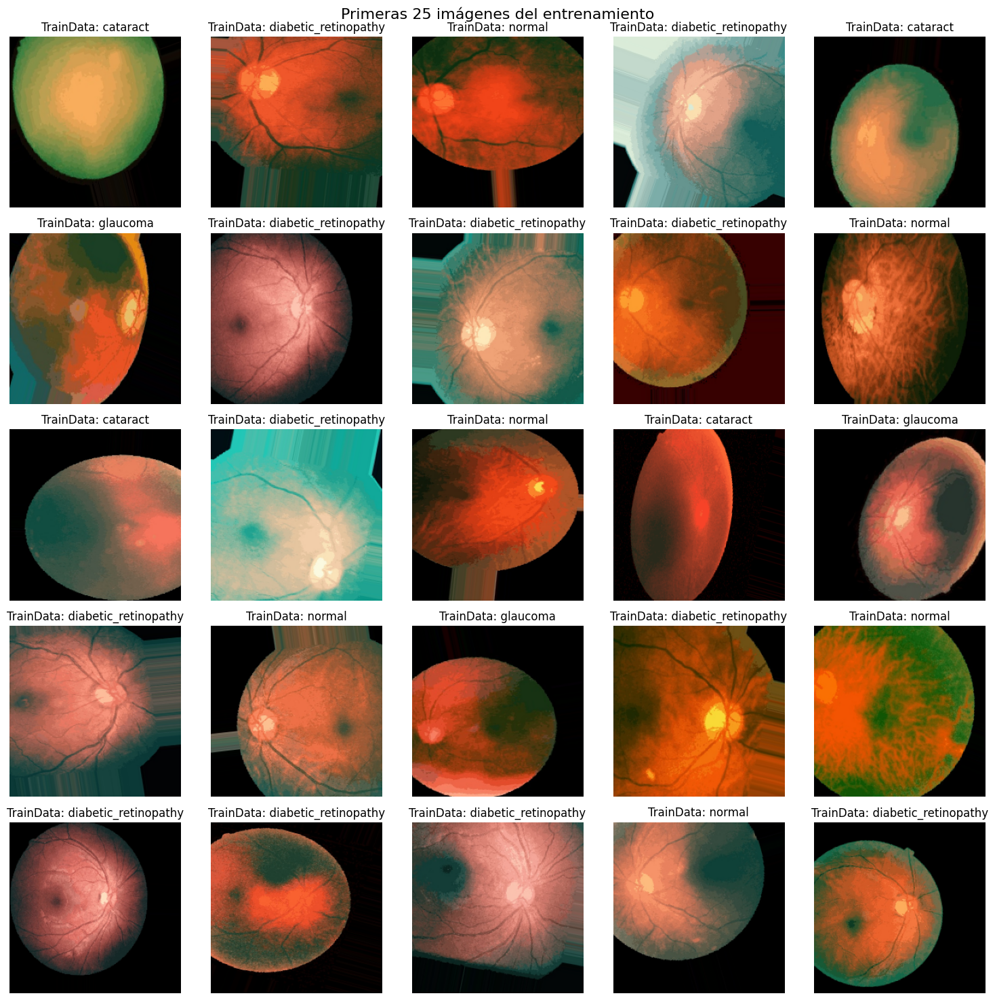

In [ ]:
# Obtener un batch de imágenes y etiquetas del generador de entrenamiento
images, labels = next(train_generator)

import matplotlib.pyplot as plt
import numpy as np

# Obtener un batch de imágenes y etiquetas del generador de entrenamiento
images, labels = next(train_generator)

# Convertir las etiquetas one-hot a índices y obtener el nombre de la clase
class_names = list(train_generator.class_indices.keys())
label_indices = np.argmax(labels, axis=1)

# Crear figura con 25 subplots (5x5)
fig, ax = plt.subplots(5, 5, figsize=(15,15))
fig.suptitle('Primeras 25 imágenes del entrenamiento', fontsize=16)

for i in range(25):
    img = images[i]
    # Si la imagen es de tipo float y sus valores exceden el rango [0,1],
    # se recortan y se convierten a uint8 para una visualización correcta.
    if img.dtype in [np.float32, np.float64]:
        img = np.clip(img, 0, 255)
        img = img.astype(np.uint8)
    ax[i//5, i%5].imshow(img)
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_title(f"TrainData: {class_names[label_indices[i]]}")

plt.tight_layout()
plt.show()


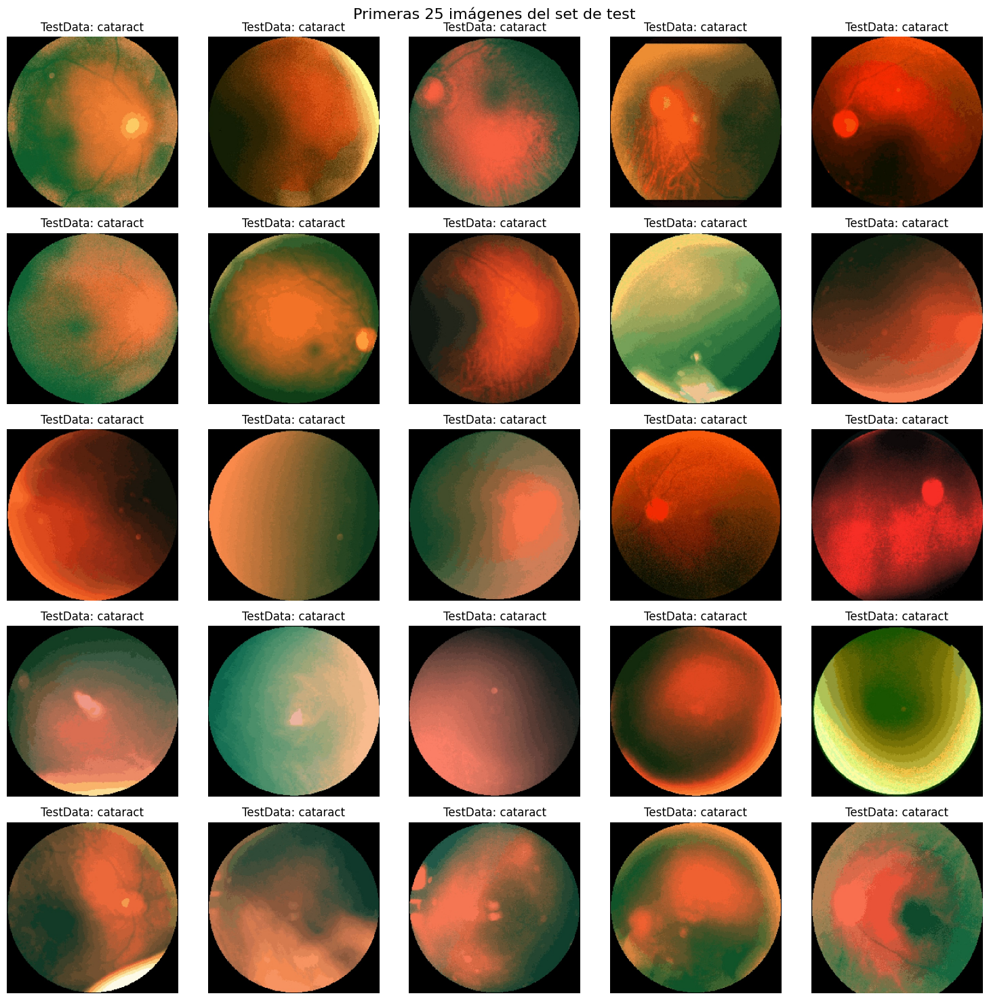

In [ ]:
# Obtener un batch de imágenes y etiquetas del generador de test
test_images, test_labels = next(test_generator)

# Convertir las etiquetas one-hot a índices y obtener el nombre de la clase
class_names = list(test_generator.class_indices.keys())
label_indices = np.argmax(test_labels, axis=1)

# Crear figura con 25 subplots (5x5)
fig, ax = plt.subplots(5, 5, figsize=(15,15))
fig.suptitle('Primeras 25 imágenes del set de test', fontsize=16)

for i in range(25):
    img = test_images[i]
    # Convertir a uint8 si la imagen es float y sus valores exceden el rango esperado
    if img.dtype in [np.float32, np.float64]:
        img = np.clip(img, 0, 255)
        img = img.astype(np.uint8)
    ax[i//5, i%5].imshow(img)
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_title(f"TestData: {class_names[label_indices[i]]}")

plt.tight_layout()
plt.show()

In [ ]:
import plotly.graph_objects as go

# Para el entrenamiento inicial
epochs_initial = len(history_initial.history['accuracy'])

# Accuracy inicial
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(1, epochs_initial+1)), y=history_initial.history['accuracy'], mode='lines', name='Train Accuracy'))
fig.add_trace(go.Scatter(x=list(range(1, epochs_initial+1)), y=history_initial.history['val_accuracy'], mode='lines', name='Validation Accuracy'))
fig.update_layout(title='Initial Training Accuracy', xaxis_title='Epoch', yaxis_title='Accuracy')
fig.show()

# Loss inicial
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(1, epochs_initial+1)), y=history_initial.history['loss'], mode='lines', name='Train Loss'))
fig.add_trace(go.Scatter(x=list(range(1, epochs_initial+1)), y=history_initial.history['val_loss'], mode='lines', name='Validation Loss'))
fig.update_layout(title='Initial Training Loss', xaxis_title='Epoch', yaxis_title='Loss')
fig.show()

# Para el fine-tuning
epochs_ft = len(history_ft.history['accuracy'])

# Accuracy fine-tuning
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(1, epochs_ft+1)), y=history_ft.history['accuracy'], mode='lines', name='Train Accuracy'))
fig.add_trace(go.Scatter(x=list(range(1, epochs_ft+1)), y=history_ft.history['val_accuracy'], mode='lines', name='Validation Accuracy'))
fig.update_layout(title='Fine-Tuning Training Accuracy', xaxis_title='Epoch', yaxis_title='Accuracy')
fig.show()

# Loss fine-tuning
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(1, epochs_ft+1)), y=history_ft.history['loss'], mode='lines', name='Train Loss'))
fig.add_trace(go.Scatter(x=list(range(1, epochs_ft+1)), y=history_ft.history['val_loss'], mode='lines', name='Validation Loss'))
fig.update_layout(title='Fine-Tuning Training Loss', xaxis_title='Epoch', yaxis_title='Loss')
fig.show()


20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 196ms/step
Reporte de Clasificación:
                      precision    recall  f1-score   support

            cataract       0.87      0.94      0.90       157
diabetic_retinopathy       0.94      0.72      0.82       166
            glaucoma       0.97      0.45      0.62       152
              normal       0.56      0.94      0.70       162

            accuracy                           0.77       637
           macro avg       0.84      0.76      0.76       637
        weighted avg       0.84      0.77      0.76       637

Matriz de Confusión:
[[147   1   1   8]
 [  1 120   1  44]
 [ 15   2  69  66]
 [  6   4   0 152]]
Accuracy: 76.61%
ROC AUC (macro, OVR): 0.95


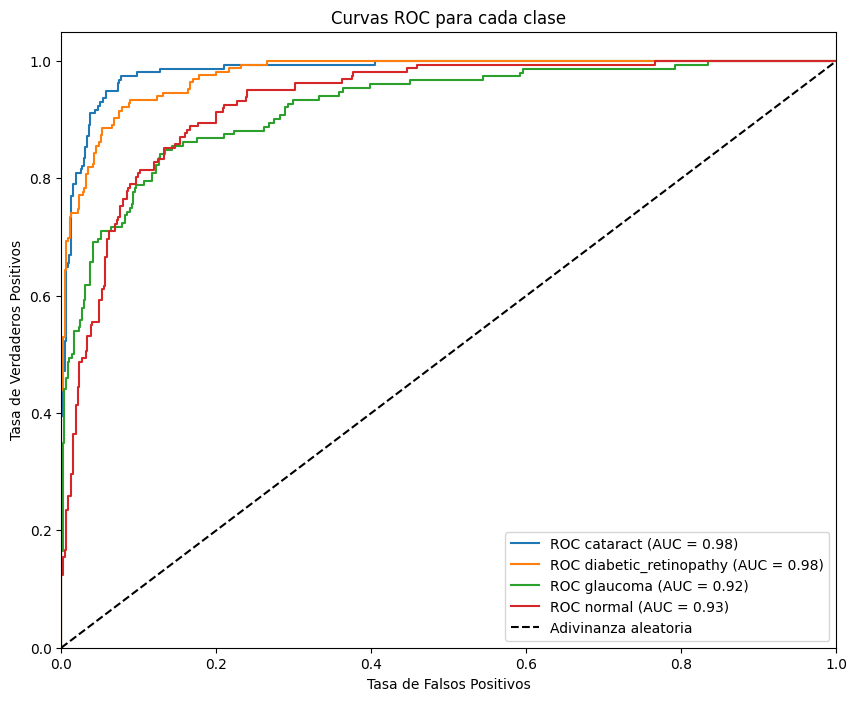

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

# Reiniciar el generador y obtener predicciones
test_generator.reset()
predictions = model.predict(test_generator)
y_pred = predictions.argmax(axis=1)
y_true = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Reporte de clasificación
print("Reporte de Clasificación:")
print(classification_report(y_true, y_pred, target_names=class_names))

# Matriz de confusión
cm = confusion_matrix(y_true, y_pred)
print("Matriz de Confusión:")
print(cm)

# Accuracy
acc = accuracy_score(y_true, y_pred)
print("Accuracy: {:.2f}%".format(acc * 100))

# Para calcular ROC AUC en un problema multi-clase es necesario binarizar las etiquetas
y_true_bin = label_binarize(y_true, classes=np.arange(len(class_names)))

# Calcular el ROC AUC macro (usando One-vs-Rest)
roc_auc_macro = roc_auc_score(y_true_bin, predictions, average="macro", multi_class="ovr")
print("ROC AUC (macro, OVR): {:.2f}".format(roc_auc_macro))

# Calcular y graficar las curvas ROC para cada clase
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    plt.plot(fpr[i], tpr[i], label=f'ROC {class_name} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Adivinanza aleatoria')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curvas ROC para cada clase')
plt.legend(loc="lower right")
plt.show()

20/20 ━━━━━━━━━━━━━━━━━━━━ 7s 382ms/step
ROC AUC (macro, OVR): 0.95


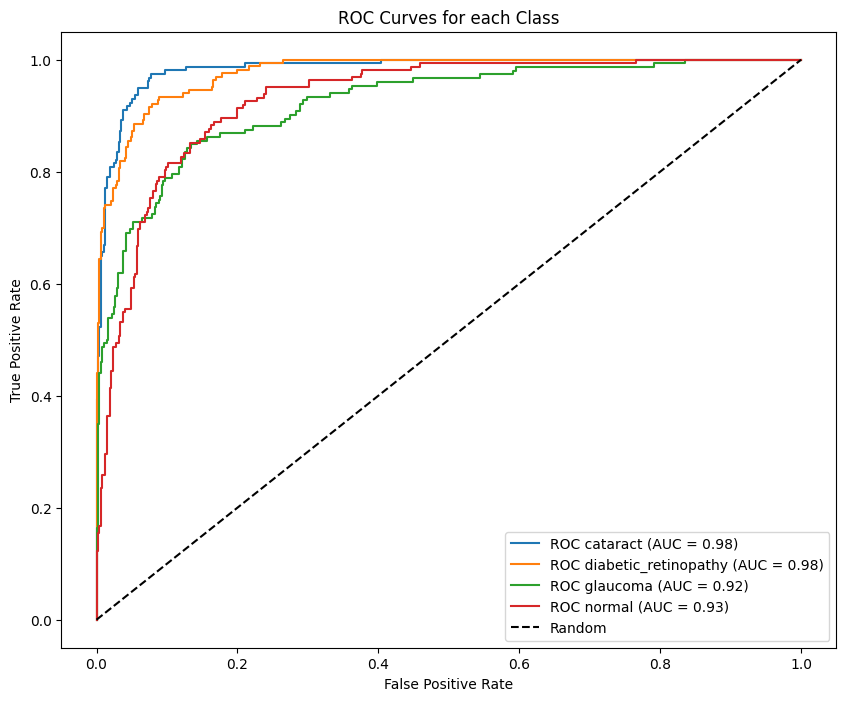

20/20 ━━━━━━━━━━━━━━━━━━━━ 18s 555ms/step


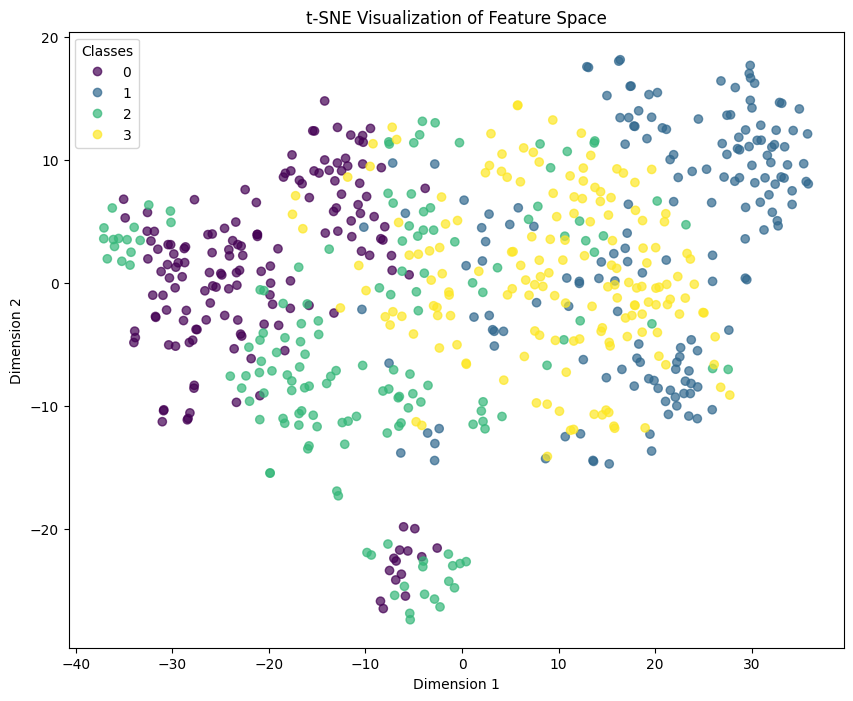

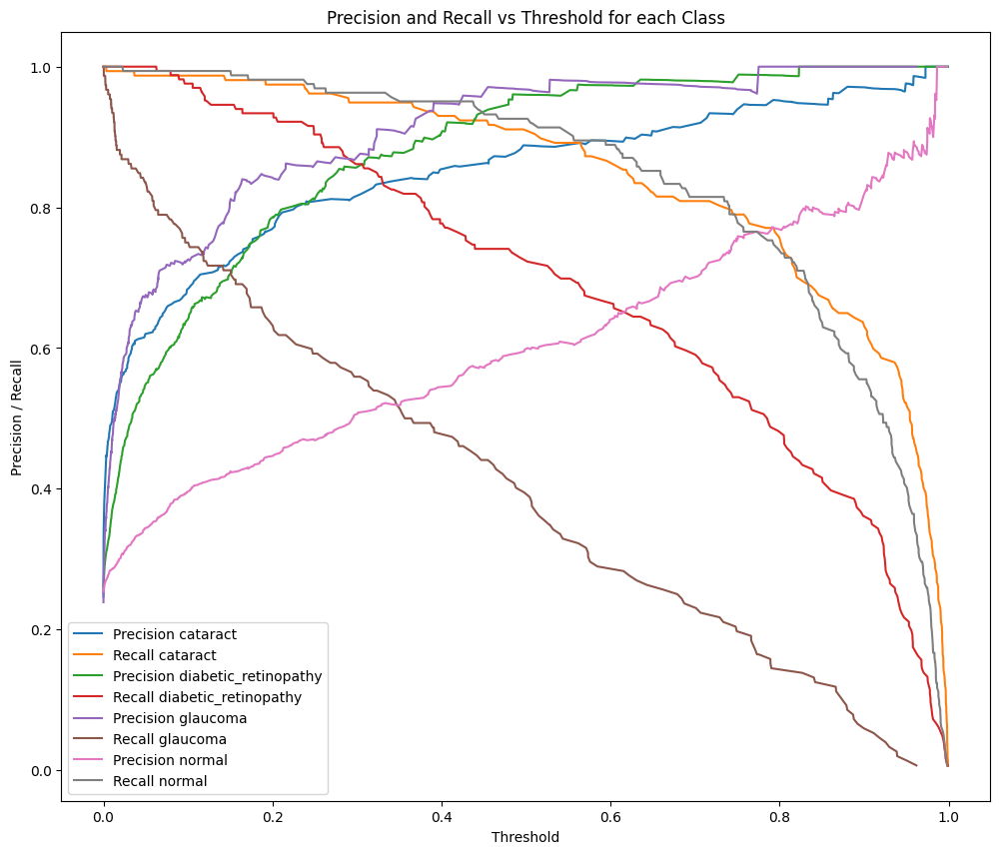

In [ ]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import numpy as np
from sklearn.metrics import roc_curve, auc, roc_auc_score, precision_recall_curve
from sklearn.preprocessing import label_binarize
from sklearn.manifold import TSNE
from tensorflow.keras.models import Model

# 1. Curvas de entrenamiento interactivas (Accuracy y Loss) - Entrenamiento inicial

epochs_initial = len(history_initial.history['accuracy'])

# Accuracy
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(1, epochs_initial+1)),
                         y=history_initial.history['accuracy'],
                         mode='lines', name='Train Accuracy'))
fig.add_trace(go.Scatter(x=list(range(1, epochs_initial+1)),
                         y=history_initial.history['val_accuracy'],
                         mode='lines', name='Validation Accuracy'))
fig.update_layout(title='Initial Training Accuracy',
                  xaxis_title='Epoch',
                  yaxis_title='Accuracy')
fig.show()

# Loss
fig = go.Figure()
fig.add_trace(go.Scatter(x=list(range(1, epochs_initial+1)),
                         y=history_initial.history['loss'],
                         mode='lines', name='Train Loss'))
fig.add_trace(go.Scatter(x=list(range(1, epochs_initial+1)),
                         y=history_initial.history['val_loss'],
                         mode='lines', name='Validation Loss'))
fig.update_layout(title='Initial Training Loss',
                  xaxis_title='Epoch',
                  yaxis_title='Loss')
fig.show()

# 2. Curvas ROC y cálculo de ROC AUC para cada clase
# Obtener predicciones en el conjunto de test
test_generator.reset()
predictions = model.predict(test_generator)
y_pred = predictions.argmax(axis=1)
y_true = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Binarizar las etiquetas para calcular el ROC AUC en un problema multi-clase
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))

roc_auc_macro = roc_auc_score(y_true_bin, predictions, average='macro', multi_class='ovr')
print("ROC AUC (macro, OVR): {:.2f}".format(roc_auc_macro))

fpr = {}
tpr = {}
roc_auc = {}
for i in range(len(class_names)):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(10,8))
for i, class_name in enumerate(class_names):
    plt.plot(fpr[i], tpr[i], label=f'ROC {class_name} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for each Class')
plt.legend(loc="lower right")
plt.show()

# 3. t-SNE para visualizar la distribución de características
# Extraer características de la capa previa a la última (por ejemplo, la salida de GlobalAveragePooling2D)
# Ajusta el índice o el nombre de la capa según tu modelo
feature_extractor = Model(inputs=model.input, outputs=model.layers[-3].output)

# Obtener las características del conjunto de test
test_generator.reset()
features = feature_extractor.predict(test_generator, verbose=1)

# Reducir la dimensionalidad a 2D con t-SNE
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features)

plt.figure(figsize=(10,8))
scatter = plt.scatter(features_2d[:,0], features_2d[:,1], c=y_true, cmap='viridis', alpha=0.7)
plt.legend(*scatter.legend_elements(), title="Classes")
plt.title("t-SNE Visualization of Feature Space")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.show()

# 4. Optimización del umbral: Curvas Precision-Recall para cada clase
plt.figure(figsize=(12,10))
for i in range(len(class_names)):
    precision, recall, thresholds = precision_recall_curve(y_true_bin[:, i], predictions[:, i])
    # thresholds tiene longitud menor en 1, usamos precision[:-1] y recall[:-1]
    plt.plot(thresholds, precision[:-1], label=f'Precision {class_names[i]}')
    plt.plot(thresholds, recall[:-1], label=f'Recall {class_names[i]}')
plt.xlabel('Threshold')
plt.ylabel('Precision / Recall')
plt.title('Precision and Recall vs Threshold for each Class')
plt.legend()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


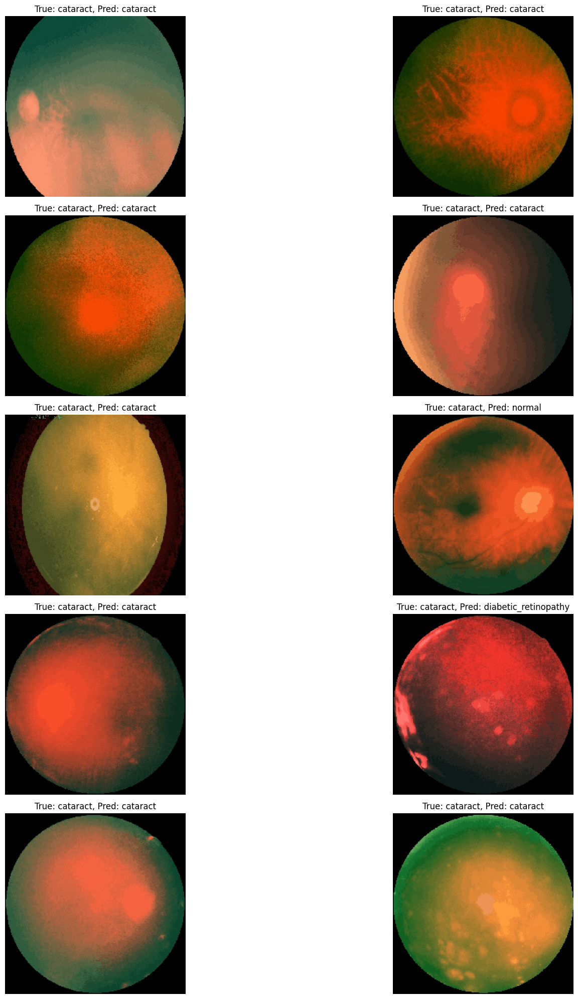

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

def display_samples_from_generator(generator, model, sample_count=10):
    # Extraer un batch del generador de test
    images, labels = next(generator)
    # Obtener predicciones del modelo para el batch
    predictions = model.predict(images)
    true_indices = np.argmax(labels, axis=1)
    pred_indices = predictions.argmax(axis=1)
    class_names = list(generator.class_indices.keys())

    plt.figure(figsize=(20, 20))
    for i in range(sample_count):
        plt.subplot(5, 2, i+1)
        img = images[i].copy()

        # Si la imagen es de tipo float, se verifica si los valores están en [0,1] o en [0,255]
        if img.dtype in [np.float32, np.float64]:
            if img.max() <= 1.0:
                img = np.clip(img, 0, 1) * 255
            else:
                img = np.clip(img, 0, 255)
            img = img.astype(np.uint8)

        # Si las imágenes se leen con cv2 se muestran en BGR, pero generalmente ImageDataGenerator las retorna en RGB.
        # Si observas que los colores no son correctos, descomenta la siguiente línea:
        # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.imshow(img)
        plt.title(f"True: {class_names[true_indices[i]]}, Pred: {class_names[pred_indices[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Uso de la función:
display_samples_from_generator(test_generator, model, sample_count=10)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step


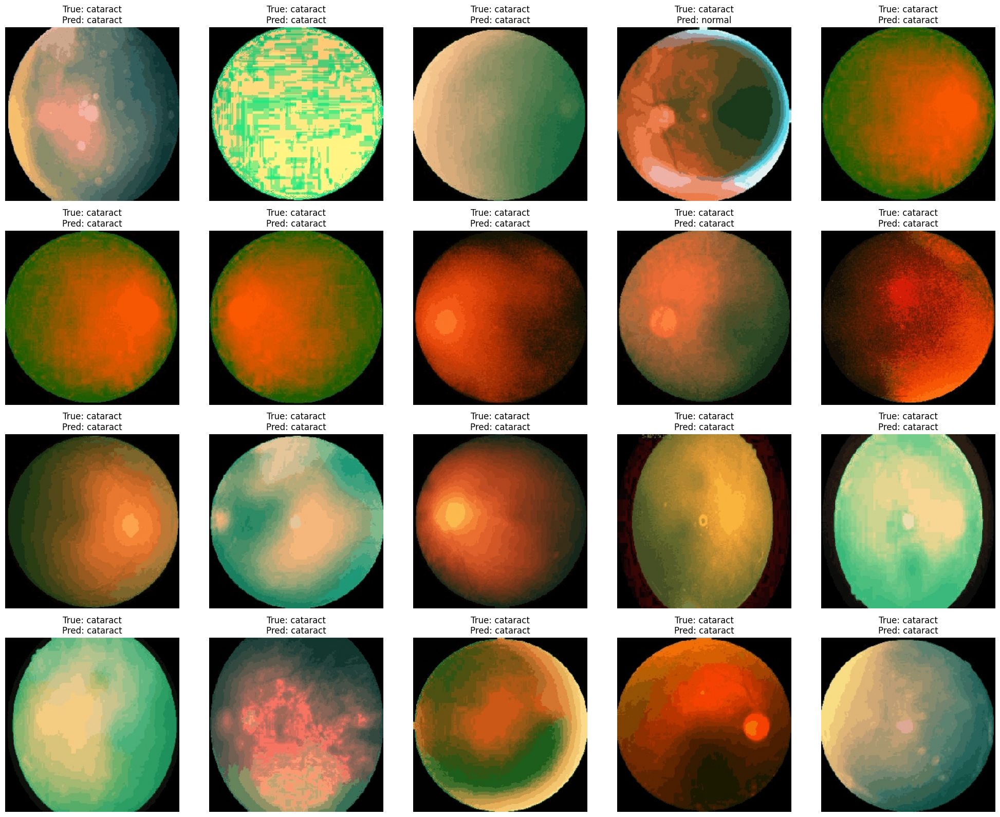

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

def display_multiple_samples_from_generator(generator, model, sample_count=20):
    images_list = []
    true_labels_list = []
    pred_labels_list = []

    # Extraer imágenes de varios batches hasta obtener la cantidad deseada
    while len(images_list) < sample_count:
        images, labels = next(generator)
        predictions = model.predict(images)
        true_indices = np.argmax(labels, axis=1)
        pred_indices = predictions.argmax(axis=1)
        for i in range(len(images)):
            if len(images_list) >= sample_count:
                break
            images_list.append(images[i])
            true_labels_list.append(true_indices[i])
            pred_labels_list.append(pred_indices[i])

    # Obtener los nombres de las clases
    class_names = list(generator.class_indices.keys())

    # Calcular dimensiones de la cuadrícula
    cols = int(np.ceil(np.sqrt(sample_count)))
    rows = int(np.ceil(sample_count / cols))

    plt.figure(figsize=(cols * 4, rows * 4))
    for i in range(sample_count):
        plt.subplot(rows, cols, i + 1)
        img = images_list[i].copy()

        # Convertir la imagen a uint8
        if img.dtype in [np.float32, np.float64]:
            # Si los valores están en [0,1], escalar a [0,255]
            if img.max() <= 1.0:
                img = np.clip(img, 0, 1) * 255
            else:
                img = np.clip(img, 0, 255)
            img = img.astype(np.uint8)

        # Si notas que los colores no son correctos, descomenta la siguiente línea
        # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.imshow(img)
        plt.title(f"True: {class_names[true_labels_list[i]]}\nPred: {class_names[pred_labels_list[i]]}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Uso de la función:
display_multiple_samples_from_generator(test_generator, model, sample_count=20)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


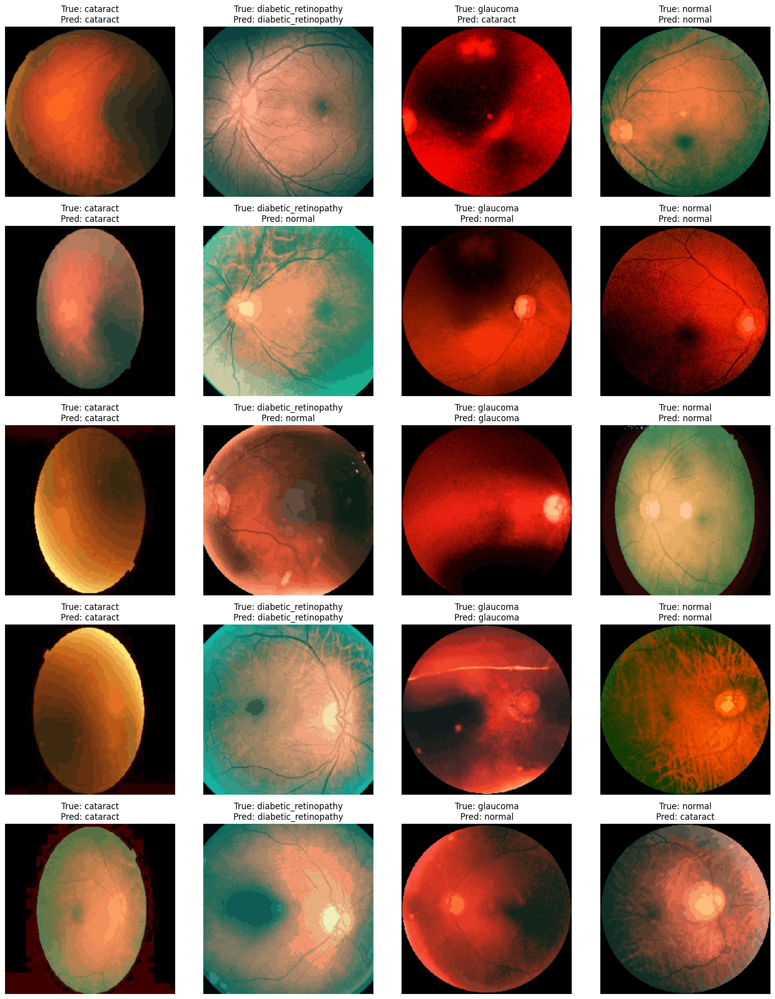

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

def display_balanced_samples_from_generator(generator, model, per_class_count=5):
    # Crear un diccionario para almacenar muestras por cada clase (según la etiqueta verdadera)
    class_names = list(generator.class_indices.keys())
    samples_per_class = {cls: [] for cls in class_names}

    # Extraer muestras hasta tener al menos per_class_count para cada clase
    while any(len(samples) < per_class_count for samples in samples_per_class.values()):
        images, labels = next(generator)
        predictions = model.predict(images)
        true_indices = np.argmax(labels, axis=1)
        pred_indices = predictions.argmax(axis=1)

        for i in range(len(images)):
            true_cls = class_names[true_indices[i]]
            # Solo agregar si no se alcanzó la cantidad deseada para esa clase
            if len(samples_per_class[true_cls]) < per_class_count:
                samples_per_class[true_cls].append((images[i], pred_indices[i]))

    # Organizar la visualización: cada columna corresponde a una clase
    n_cols = len(class_names)
    n_rows = per_class_count
    plt.figure(figsize=(n_cols * 4, n_rows * 4))

    for col, cls in enumerate(class_names):
        for row in range(n_rows):
            plt.subplot(n_rows, n_cols, row * n_cols + col + 1)
            img, pred_idx = samples_per_class[cls][row]

            # Ajuste de formato: convertir a uint8 si es float
            if img.dtype in [np.float32, np.float64]:
                if img.max() <= 1.0:
                    img = np.clip(img, 0, 1) * 255
                else:
                    img = np.clip(img, 0, 255)
                img = img.astype(np.uint8)

            # Si las imágenes salen en colores extraños, descomenta la siguiente línea para convertir de BGR a RGB
            # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            plt.imshow(img)
            plt.title(f"True: {cls}\nPred: {class_names[pred_idx]}")
            plt.axis('off')
    plt.tight_layout()
    plt.show()

# Uso de la función:
display_balanced_samples_from_generator(test_generator, model, per_class_count=5)


In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Genera un mapa de calor Grad-CAM para una imagen dada.

    Parámetros:
      - img_array: imagen preprocesada con forma (1, H, W, 3)
      - model: modelo entrenado de Keras
      - last_conv_layer_name: nombre de la última capa convolucional en el modelo
      - pred_index: (opcional) índice de la predicción sobre la cual calcular el gradiente.
                    Si es None se toma el de la predicción mayor.

    Retorna:
      - heatmap: mapa de calor normalizado entre 0 y 1.
    """
    # Crear un modelo que devuelve la salida de la última capa convolucional y la salida final
    grad_model = Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Calcular activaciones y gradientes con GradientTape
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        # Se obtiene la probabilidad correspondiente a la clase objetivo
        class_channel = predictions[:, pred_index]

    # Calcular el gradiente de la clase objetivo respecto a la salida de la capa convolucional
    grads = tape.gradient(class_channel, conv_outputs)

    # Promediar los gradientes a lo largo de los ejes espaciales y de canales
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    # Ponderar cada mapa de activación por el gradiente promedio
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalizar el mapa de calor para que los valores estén entre 0 y 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img, heatmap, alpha=0.4):
    """
    Superpone el mapa de calor Grad-CAM sobre la imagen original y la muestra.

    Parámetros:
      - img: imagen original en formato uint8 con valores en [0, 255]
      - heatmap: mapa de calor generado por make_gradcam_heatmap (valores entre 0 y 1)
      - alpha: factor de transparencia del heatmap
    """
    # Redimensionar el heatmap para que tenga el mismo tamaño que la imagen
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    # Aplicar un colormap para visualizar el heatmap
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    # Superponer el heatmap sobre la imagen original
    superimposed_img = cv2.addWeighted(heatmap, alpha, img, 1 - alpha, 0)

    plt.figure(figsize=(8,8))
    # Convertir BGR a RGB si la imagen original estaba en BGR
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title("Grad-CAM")
    plt.axis('off')
    plt.show()



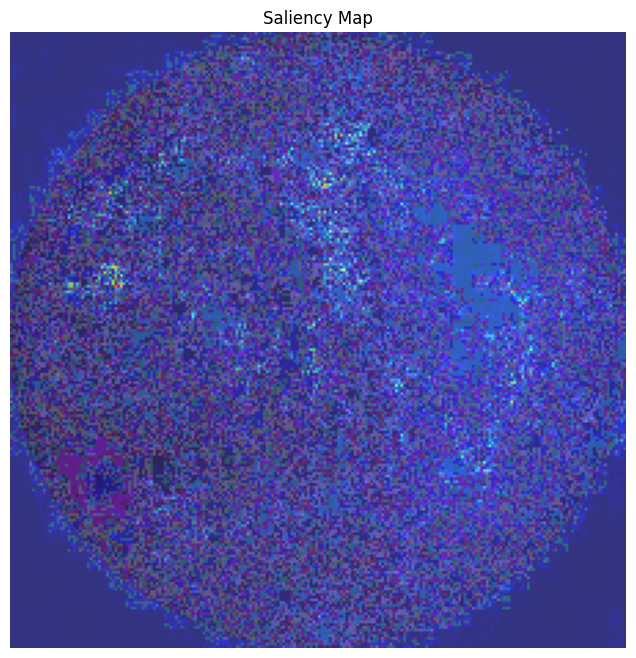

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

def compute_saliency_map(model, img_array, class_index=None):
    """
    Calcula el mapa de saliencia de una imagen para una clase dada.

    Parámetros:
      - model: modelo entrenado de Keras.
      - img_array: imagen preprocesada con forma (1, H, W, 3).
      - class_index: índice de la clase para la que se calcula el saliency.
                     Si None, se toma la predicción mayor.

    Retorna:
      - saliency: mapa de saliencia (valores absolutos de los gradientes).
    """
    img_tensor = tf.convert_to_tensor(img_array)

    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        if class_index is None:
            class_index = tf.argmax(preds[0])
        class_score = preds[:, class_index]

    grads = tape.gradient(class_score, img_tensor)
    # Tomar la magnitud de los gradientes
    saliency = tf.reduce_max(tf.abs(grads), axis=-1)[0]
    return saliency.numpy()

def display_saliency_map(img, saliency, cmap='jet', alpha=0.6):
    """
    Superpone el mapa de saliencia sobre la imagen original.

    Parámetros:
      - img: imagen original en formato uint8.
      - saliency: mapa de saliencia (2D).
      - cmap: colormap para el mapa.
      - alpha: transparencia para la superposición.
    """
    # Normalizar el mapa de saliencia a [0, 255]
    saliency_norm = np.uint8(255 * (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8))
    saliency_colored = cv2.applyColorMap(saliency_norm, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(saliency_colored, alpha, img, 1 - alpha, 0)

    plt.figure(figsize=(8,8))
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title("Saliency Map")
    plt.axis('off')
    plt.show()

# Ejemplo de uso:
# 1. Extraer una imagen de test del generador
test_images, test_labels = next(test_generator)
sample_img = test_images[0]
sample_img_array = np.expand_dims(sample_img, axis=0)

# 2. Desprocesar la imagen para visualizarla (ejemplo para EfficientNet que escala imágenes a [-1, 1])
sample_img_display = ((sample_img + 1) * 127.5).astype(np.uint8)

# 3. Calcular el mapa de saliencia
saliency = compute_saliency_map(model, sample_img_array)

# 4. Mostrar la imagen con el mapa de saliencia superpuesto
display_saliency_map(sample_img_display, saliency)


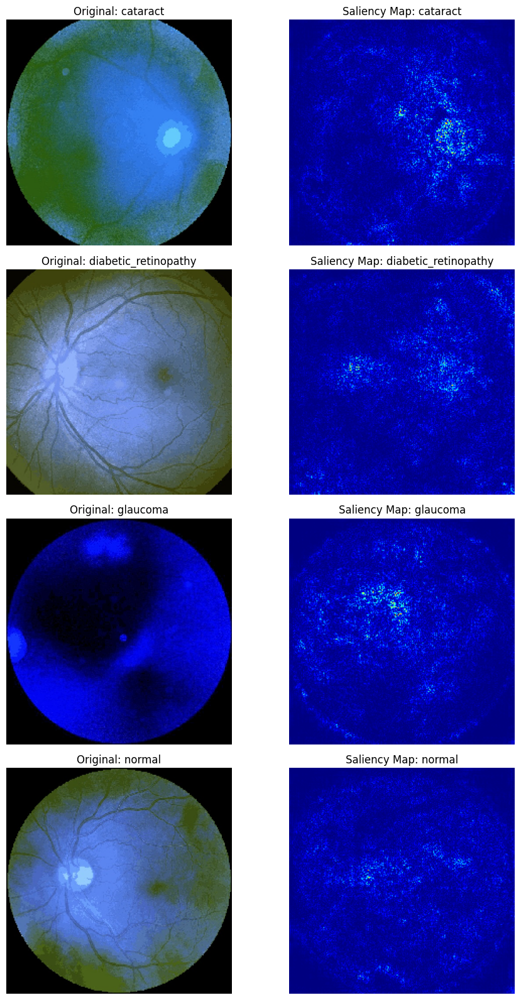

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import Model
from sklearn.utils import shuffle

# Función para calcular saliency map (ya definida previamente)
def compute_saliency_map(model, img_array, class_index=None):
    """
    Calcula el mapa de saliencia de una imagen para una clase dada.

    Parámetros:
      - model: modelo entrenado de Keras.
      - img_array: imagen preprocesada con forma (1, H, W, 3).
      - class_index: índice de la clase para la que se calcula el saliency.
                     Si None, se toma la predicción mayor.

    Retorna:
      - saliency: mapa de saliencia (valores absolutos de los gradientes).
    """
    img_tensor = tf.convert_to_tensor(img_array)

    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        if class_index is None:
            class_index = tf.argmax(preds[0])
        class_score = preds[:, class_index]

    grads = tape.gradient(class_score, img_tensor)
    saliency = tf.reduce_max(tf.abs(grads), axis=-1)[0]
    return saliency.numpy()

def process_for_display(img):
    """
    Asegura que la imagen se encuentre en el rango [0,255] y en formato uint8 para visualizarla.
    Se asume que si es float y max <=1, está en [0,1].
    """
    if img.dtype in [np.float32, np.float64]:
        if img.max() <= 1.0:
            img = np.clip(img, 0, 1) * 255
        else:
            img = np.clip(img, 0, 255)
        img = img.astype(np.uint8)
    return img

# Lista de clases (según el generador)
class_names = list(test_generator.class_indices.keys())

# Diccionario para almacenar una imagen representativa para cada clase
sample_images = {}

# Extraer batches del generador hasta recolectar una imagen para cada clase
while len(sample_images) < len(class_names):
    imgs, lbls = next(test_generator)
    true_indices = np.argmax(lbls, axis=1)
    for i, cls_idx in enumerate(true_indices):
        cls_name = class_names[cls_idx]
        if cls_name not in sample_images:
            sample_images[cls_name] = imgs[i]
    # Reiniciar el generador si es necesario
    if test_generator.batch_index == 0:
        # Mezclar el orden para mayor aleatoriedad
        pass

# Crear figura para mostrar las comparaciones (2 columnas: original y saliency) por cada clase
n_classes = len(class_names)
fig, axs = plt.subplots(n_classes, 2, figsize=(10, n_classes*4))

for row, cls in enumerate(class_names):
    # Obtener la imagen original
    orig_img = sample_images[cls]
    orig_img_disp = process_for_display(orig_img.copy())

    # Expandir dimensiones para calcular saliency map (asumiendo que el preprocesamiento ya se realizó)
    img_array = np.expand_dims(orig_img, axis=0)
    saliency = compute_saliency_map(model, img_array, class_index=None)

    # Normalizar el saliency map para visualizarlo
    saliency_norm = saliency.copy()
    saliency_norm = (saliency_norm - saliency_norm.min()) / (saliency_norm.max() - saliency_norm.min() + 1e-8)
    saliency_disp = np.uint8(255 * saliency_norm)
    # Convertir a colormap para mejor visualización
    saliency_disp = cv2.applyColorMap(saliency_disp, cv2.COLORMAP_JET)

    # Mostrar imagen original en la primera columna
    axs[row, 0].imshow(cv2.cvtColor(orig_img_disp, cv2.COLOR_BGR2RGB))
    axs[row, 0].set_title(f"Original: {cls}")
    axs[row, 0].axis('off')

    # Mostrar saliency map en la segunda columna
    axs[row, 1].imshow(cv2.cvtColor(saliency_disp, cv2.COLOR_BGR2RGB))
    axs[row, 1].set_title(f"Saliency Map: {cls}")
    axs[row, 1].axis('off')

plt.tight_layout()
plt.show()


20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 267ms/step


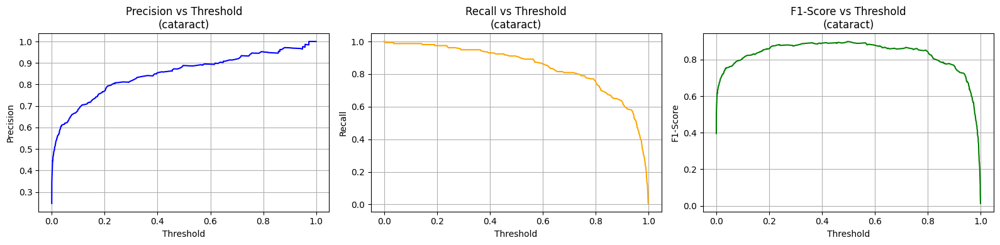

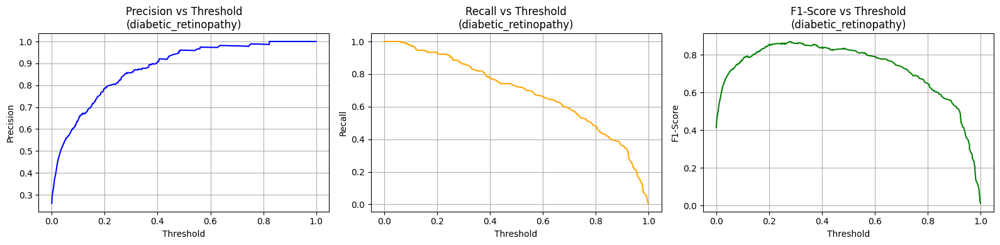

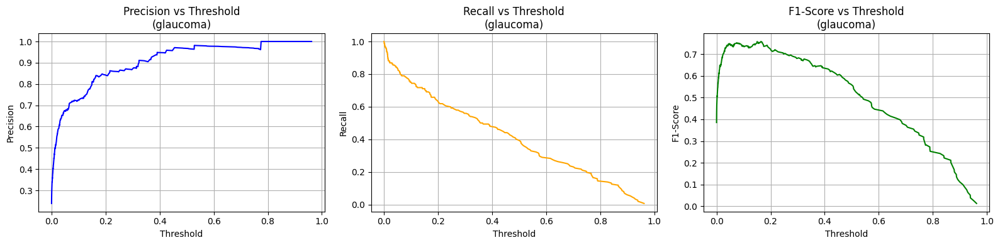

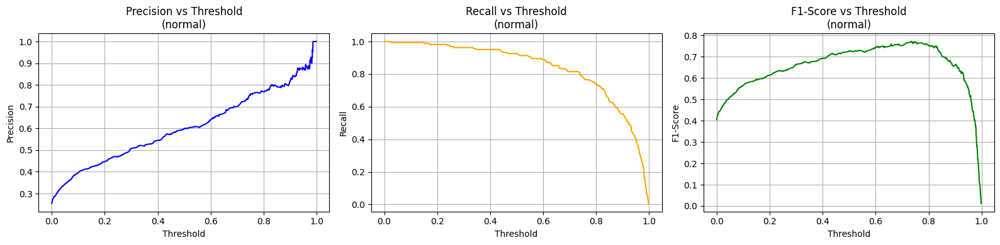

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import label_binarize

# Reiniciar el generador y obtener las predicciones del modelo
test_generator.reset()
pred_probs = model.predict(test_generator)  # Probabilidades de cada clase
y_true = test_generator.classes             # Índices de la clase verdadera
class_names = list(test_generator.class_indices.keys())

# Binarizar las etiquetas verdaderas para tratar el problema como one-vs-rest
y_true_bin = label_binarize(y_true, classes=np.arange(len(class_names)))

# Para cada clase, calculamos las curvas Precision-Recall y F1-score vs Threshold
for i, cls in enumerate(class_names):
    precision, recall, thresholds = precision_recall_curve(y_true_bin[:, i], pred_probs[:, i])
    # Los arrays de precision y recall tienen longitud = len(thresholds) + 1.
    # Calculamos el F1-score para cada umbral (usando los valores hasta el penúltimo elemento)
    f1s = []
    for p, r in zip(precision[:-1], recall[:-1]):
        f1 = 2 * p * r / (p + r + 1e-8)  # Se suma un pequeño valor para evitar división por cero.
        f1s.append(f1)

    # Graficar Precision vs Threshold
    plt.figure(figsize=(16, 4))

    plt.subplot(1, 3, 1)
    plt.plot(thresholds, precision[:-1], label="Precision", color='blue')
    plt.xlabel("Threshold")
    plt.ylabel("Precision")
    plt.title(f"Precision vs Threshold\n({cls})")
    plt.grid(True)

    # Graficar Recall vs Threshold
    plt.subplot(1, 3, 2)
    plt.plot(thresholds, recall[:-1], label="Recall", color='orange')
    plt.xlabel("Threshold")
    plt.ylabel("Recall")
    plt.title(f"Recall vs Threshold\n({cls})")
    plt.grid(True)

    # Graficar F1-Score vs Threshold
    plt.subplot(1, 3, 3)
    plt.plot(thresholds, f1s, label="F1-Score", color='green')
    plt.xlabel("Threshold")
    plt.ylabel("F1-Score")
    plt.title(f"F1-Score vs Threshold\n({cls})")
    plt.grid(True)

    plt.tight_layout()
    plt.show()
